# Студент: Спиридонов Кирилл Анатольевич
# Группа: М8О-207М-19

# Домашняя работа №3

In [27]:
import numpy as np
import matplotlib.pyplot as plt

import cv2 as cv
from tqdm import tqdm

from numpy.lib.stride_tricks import as_strided
from matplotlib.patches import Rectangle

# Задача №1 - Лес или пустыня?

Часто при анализе изображений местности необходимо понять ее характер. В частности, если определить, что на изображении преобладет вода, то имеет смысл искать корабли на таком изображении. Если на картинке густой лес, то, возможно, это не лучшая зона для посадки дрона или беспилотника.

Ваша задача - написать программу, которая будет отличать лес от пустыни. В приложении можно найти реальные спутниковые снимки лесов и пустынь.

Примеры изображений:
<table><tr>
    <td> <img src="https://i.ibb.co/nmHHctW/test_image_00.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/dM77C4b/test_image_06.jpg" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

In [2]:
from PIL import Image
def get_colors(image_path):
    image = Image.open(image_path)
    image = image.convert('RGB')
    width, height = image.size
    print(f'Original dimensions: {width} x {height}')
    
    detected_colors = {} # hash-map
    for x in range(0, width):
        for y in range(0, height):
            r, g, b = image.getpixel((x, y))
            rgb = f'{r}:{g}:{b}'
            if rgb in detected_colors:
                detected_colors[rgb] += 1
            else: 
                detected_colors[rgb] = 1
    all_colors = detected_colors.items()
    all_colors = [x[0] for x in all_colors]
    print(max(all_colors))
    print(min(all_colors))

In [3]:
def landscape_detection(image): # false - desert, true - forest
    # checking colors to chose the right
    green_border = [[36, 0, 0], [86, 255, 255]]
    gl = np.array(green_border[0], dtype=image.dtype)
    gr = np.array(green_border[1], dtype=image.dtype)

    new_shape = (image.shape[0] * image.shape[1], image.shape[-1])
    new_strides = image.strides[1:]
    image_strided = as_strided(image, shape=new_shape, strides=new_strides)
    
    colors, counts = np.unique(image_strided, return_counts=True, axis=0)
    color_mode = colors[np.argmax(counts)]

    return np.all(gl <= color_mode) and np.all(color_mode <= gr)

In [4]:
path = './desert_forest/test_image_'

  0%|          | 0/16 [00:00<?, ?it/s]

Original dimensions: 768 x 768
9:43:10
0:10:0


  6%|▋         | 1/16 [00:01<00:17,  1.15s/it]

Original dimensions: 768 x 768
9:33:20
0:20:15


 12%|█▎        | 2/16 [00:02<00:15,  1.08s/it]

Original dimensions: 768 x 768
9:42:25
0:18:8


 19%|█▉        | 3/16 [00:03<00:15,  1.16s/it]

Original dimensions: 768 x 768
9:9:9
0:0:0


 25%|██▌       | 4/16 [00:04<00:14,  1.20s/it]

Original dimensions: 768 x 768
9:8:6
0:0:0


 31%|███▏      | 5/16 [00:05<00:12,  1.16s/it]

Original dimensions: 768 x 768
9:43:6
0:10:0


 38%|███▊      | 6/16 [00:06<00:11,  1.13s/it]

Original dimensions: 768 x 768
99:87:73
100:79:60


 44%|████▍     | 7/16 [00:07<00:10,  1.14s/it]

Original dimensions: 768 x 768
9:9:0
0:0:0


 50%|█████     | 8/16 [00:09<00:08,  1.10s/it]

Original dimensions: 768 x 768
9:45:17
0:10:0


 56%|█████▋    | 9/16 [00:09<00:07,  1.06s/it]

Original dimensions: 768 x 768
9:40:6
0:10:0


 62%|██████▎   | 10/16 [00:11<00:06,  1.06s/it]

Original dimensions: 768 x 768
99:83:47
100:62:17


 69%|██████▉   | 11/16 [00:12<00:05,  1.06s/it]

Original dimensions: 768 x 768
99:93:71
100:68:21


 75%|███████▌  | 12/16 [00:13<00:04,  1.08s/it]

Original dimensions: 768 x 768
98:75:25
100:79:24


 81%|████████▏ | 13/16 [00:14<00:03,  1.07s/it]

Original dimensions: 768 x 768
99:97:84
100:100:88


 88%|████████▊ | 14/16 [00:15<00:02,  1.08s/it]

Original dimensions: 768 x 768
245:213:172
103:75:36


 94%|█████████▍| 15/16 [00:16<00:01,  1.09s/it]

Original dimensions: 768 x 768
99:97:59
100:67:24


100%|██████████| 16/16 [00:17<00:00,  1.10s/it]


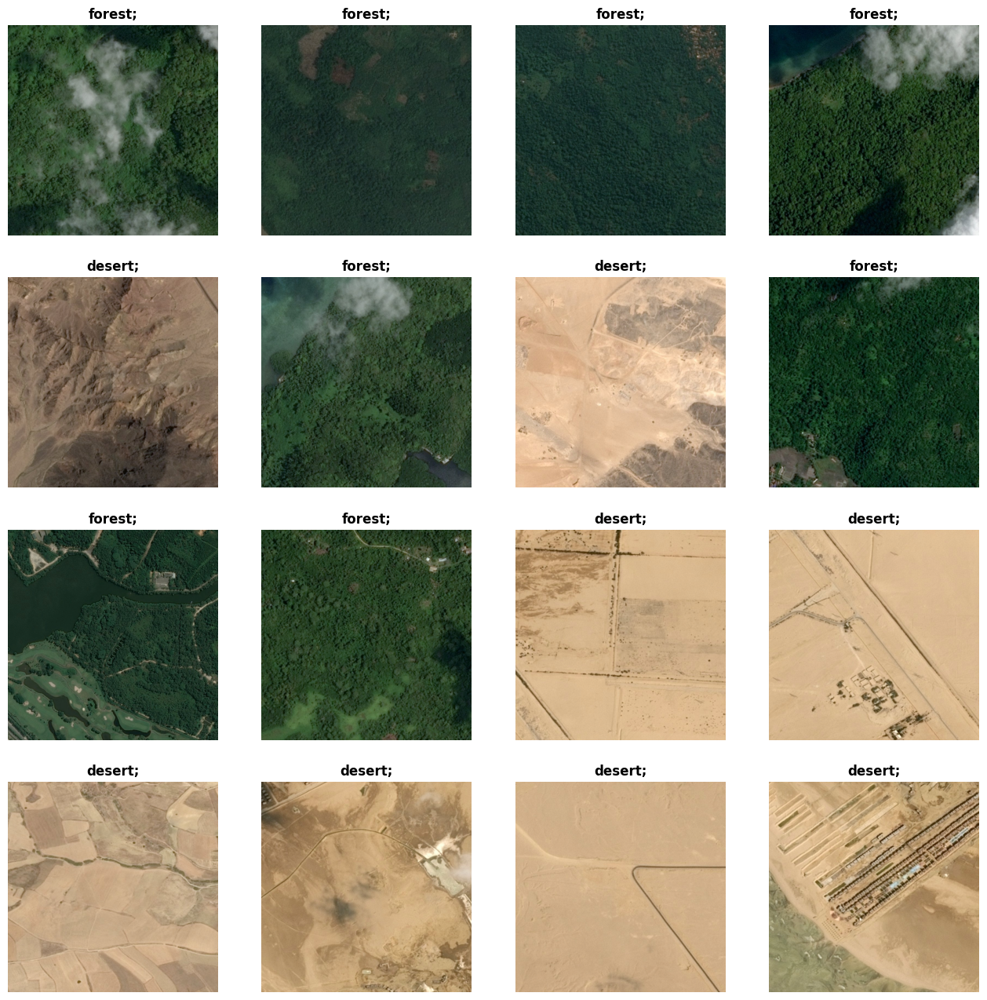

In [5]:
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
axes = axes.ravel()

for i in tqdm(range(axes.size)):
    image_path = f'{path}0{i}.jpg' if i < 10 else f'{path}{i}.jpg'
    get_colors(image_path) # just checking the numbers

    image = cv.imread(image_path)
    image = cv.cvtColor(image, code=cv.COLOR_BGR2HSV)
    
    title = ""
    if landscape_detection(image):
        title = "forest"
    else:
        title = "desert"
        
    
    image = cv.cvtColor(image, code=cv.COLOR_HSV2RGB)
    axes[i].set_title(f'{title};', fontweight='bold')
    axes[i].imshow(image)
    axes[i].axis('off')
    
plt.show()

# Задача №2 - Реализовать Image-blending на основе сшивки по градиентам

Задача - взять фото двух лиц : ваше и друга, с помощью метода Poisson image editing совместить глаза, нос и рот с первого изображения со вторым. Суть в том, что при использовании такого метода границы совмещенного изображения не видны.

Статья, где описан метод  

Patrick Pérez, Michel Gangnet, and Andrew Blake. 2003. Poisson image editing. ACM Trans. Graph. 22, 3 (July 2003), 313–318. https://doi.org/10.1145/882262.882269

Пример такого совмещения:

<img src="../homework/blending/blending.png" alt="Drawing" style="width: 700px;"/>


In [18]:
# Загрузка предобученных каскадов Хаара
face_cascade = cv.CascadeClassifier('./cascades/haarcascade_frontalface_default.xml')
eye_cascade = cv.CascadeClassifier('./cascades/haarcascade_eye.xml')
nose_cascade = cv.CascadeClassifier('./cascades/haarcascade_mcs_nose.xml')
mouth_cascade = cv.CascadeClassifier('./cascades/haarcascade_mcs_mouth.xml')

In [19]:
def detect_face_parts(img_path):
    """Функция для обнаружения частей лица (глаза, нос, рот) на изображении."""
    # Загрузка изображения и аттрибутов
    img = cv.imread(img_path)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)

    # Создание маски на основе обнаруженных частей лица
    mask = np.zeros_like(gray)
    for (x, y, w, h) in faces:
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = img[y:y+h, x:x+w]

        # Обнаружение глаз
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex, ey, ew, eh) in eyes:
            cv.rectangle(mask, (ex + x, ey + y), (ex + ew + x, ey + eh + y), 255, -1)

        # Обнаружение носа
        nose = nose_cascade.detectMultiScale(roi_gray)
        for (nx, ny, nw, nh) in nose:
            cv.rectangle(mask, (nx + x, ny + y), (nx + nw + x, ny + nh + y), 255, -1)
        
        # Обнаружение рта
        mouth = mouth_cascade.detectMultiScale(roi_gray)
        for (mx, my, mw, mh) in mouth:
            cv.rectangle(mask, (mx + x, my + y), (mx + mw + x, my + mh + y), 255, -1)

    return img, mask


In [20]:
def resize_image(src_img, dst_img):
    height, width = dst_img.shape[:2]
    resized_src = cv.resize(src_img, (width, height))
    return resized_src


In [21]:
def poisson_blending(src_img, dst_img, src_mask, center):
    """Применение Poisson-Image-Editing для seamless cloning."""
    src_resized = resize_image(src_img, dst_img)
    src_mask_resized = cv.resize(src_mask, (dst_img.shape[1], dst_img.shape[0]))

    # Применение метода seamless cloning
    seamless_img = cv.seamlessClone(src_resized, dst_img, src_mask_resized, center, cv.NORMAL_CLONE)
    return seamless_img

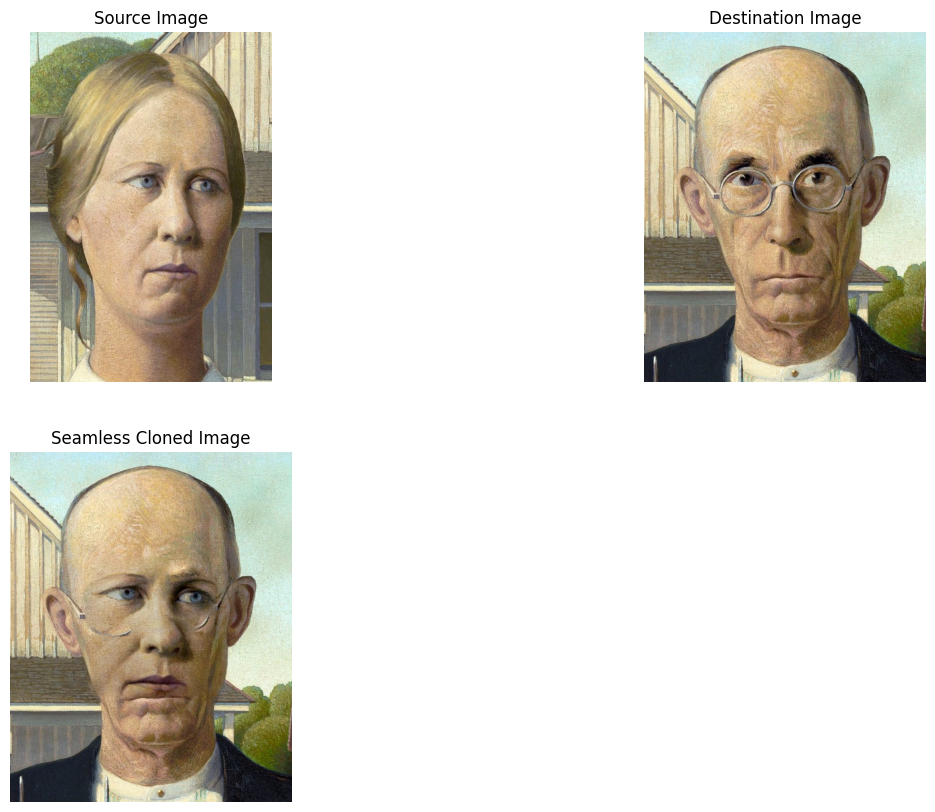

In [23]:
src_img, src_mask = detect_face_parts("./faces/face_1.jpg")
dst_img, dst_mask = detect_face_parts("./faces/face_2.jpg")
height, width = dst_img.shape[:2]
center = (width // 2, height // 2)

seamless_img = poisson_blending(src_img, dst_img, src_mask, center)

plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.imshow(cv.cvtColor(src_img, cv.COLOR_BGR2RGB))
plt.title('Source Image')
plt.axis('off')
plt.subplot(2, 2, 2)
plt.imshow(cv.cvtColor(dst_img, cv.COLOR_BGR2RGB))
plt.title('Destination Image')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv.cvtColor(seamless_img, cv.COLOR_BGR2RGB))
plt.title('Seamless Cloned Image')
plt.axis('off')

plt.show()

# Задача №3 - Найди клетки

Даны снимки раковых клеток. Существует задача - определить стадию рака клетки по такому изображению. Для того, чтобы подойти к решению классификации рака клетки, необходимо сначала подготовить данные.

Исходные изображения в реальных задачах могут быть очень большого размера (более 20000 px). Однако из визуального анализа можно заметить, что большая часть этих снимков пустая и не несет в себе полезную информацию.

Ваша задача выделить небольшие ячейки изображений из исходного так, чтобы на ячейках было только изображение клетки.

Пример исходного изображения и нарезанных ячеек клетки.
<img src="../img/cell_example.png" alt="Drawing" style="width: 500px;"/>

В качестве аргументов у функции будут значения:
1. исходное изображние;
2. размер ячейки;
3. количество ячеек.

__Доп вопрос__ - как можно выяснить какие нужны значения аргументов, чтобы они подходили для большинства исходных снимков?

In [34]:
import numpy as np
import cv2 as cv

class CellScapeBuilder:
    def __init__(self):
        self.x = None
        self.y = None
        self.image = None
        self.wcells = None
        self.modified_image = None
        self.cnum = None
        self.sq_size = None

    def transform(self, image, cnum, sq_size):
        self.__init__()
        self.cnum = cnum
        self.sq_size = sq_size

        # Image expansion
        self.expand_image(image)

        # Weighted cells calculation
        self.calculate_weighted_cells()

        # Cut image calculation
        self.cut_image()

        return self.modified_image

    def expand_image(self, image):
        expand_h = image.shape[1] % self.sq_size
        expand_v = image.shape[0] % self.sq_size
        shape_h = (image.shape[0], expand_h, 3)
        shape_v = (expand_v, image.shape[1] + expand_h, 3)
        pad_h = np.ones(shape_h, dtype=np.uint8) * 255
        pad_v = np.ones(shape_v, dtype=np.uint8) * 255
        
        image_expanded = np.hstack((image, pad_h))
        image_expanded = np.vstack((image_expanded, pad_v))
        
        self.image = image_expanded

    def calculate_weighted_cells(self):
        image_gray = cv.cvtColor(self.image, code=cv.COLOR_RGB2GRAY)
        heigth = image_gray.shape[0] // self.sq_size
        width = image_gray.shape[1] // self.sq_size
        wcells = np.zeros((heigth, width), dtype=np.uint8)

        for i in range(heigth):
            for j in range(width):
                i_start, i_end = i * self.sq_size, (i + 1) * self.sq_size
                j_start, j_end = j * self.sq_size, (j + 1) * self.sq_size
                cell_current = image_gray[i_start: i_end, j_start: j_end].ravel()
                wcells[i, j] = np.sum(cell_current) // cell_current.size

        self.wcells = wcells

    def cut_image(self):
        indices = np.argsort(self.wcells, axis=None)
        y, x = np.unravel_index(indices, self.wcells.shape)
        heigth, width = self.get_best_image_shape()
        
        modified_image = None
        for k in range(heigth):
            row = None
            for l in range(width):
                ind = k * width + l
                i_start, i_end = y[ind] * self.sq_size, (y[ind] + 1) * self.sq_size
                j_start, j_end = x[ind] * self.sq_size, (x[ind] + 1) * self.sq_size
                cell = self.image[i_start: i_end, j_start: j_end, :]
                row = cell if row is None else np.hstack((row, cell))
            modified_image = row if modified_image is None else np.vstack((modified_image, row))

        self.modified_image = modified_image
        self.x, self.y = x, y

    def get_best_image_shape(self):
        heigth, width = 1, self.cnum
        limit = int(np.ceil(self.cnum ** 0.5) + 1) 
        
        for i in range(2, limit):
            if self.cnum % i == 0:
                width, heigth = i, self.cnum // i

        return heigth, width


In [35]:
cell_amount, cell_size = 55, 100
path = './cells/'

transformer = CellScapeBuilder()

100%|██████████| 6/6 [00:01<00:00,  4.52it/s]


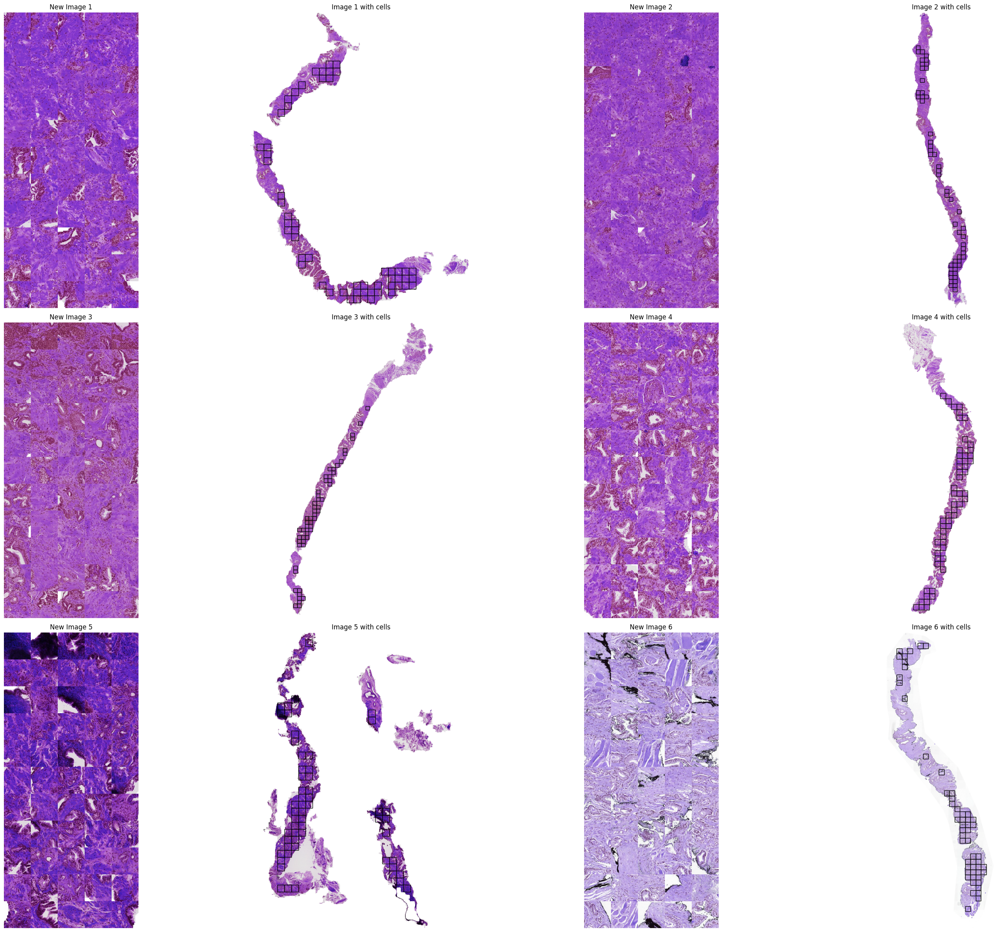

In [36]:
fig, axes = plt.subplots(3, 4, figsize=(32, 24))
axes = axes.ravel()

for i in tqdm(range(axes.size // 2)):
    
    image_path = f'{path}train{i}_1.jpeg'
    image = cv.imread(image_path)
    
    modified_image = transformer.transform(image, cell_amount, cell_size)
    
    axes[2 * i + 1].imshow(transformer.image)
    for j in range(transformer.cnum):
      x = transformer.x[j] * transformer.sq_size
      y = transformer.y[j] * transformer.sq_size
      rect = Rectangle((x, y), transformer.sq_size, transformer.sq_size, linewidth=1, edgecolor='k', facecolor='none')
      axes[2 * i + 1].add_patch(rect)
    axes[2 * i + 1].axis('off')
    axes[2 * i + 1].set_title(f"Image {i+1} with cells")
    
    axes[2 * i].imshow(modified_image)
    axes[2 * i].axis('off')
    axes[2 * i].set_title(f"New Image {i+1}")
plt.tight_layout()
plt.show()